## Config

In [16]:
# --- YOLO Dataset Exploratory Data Analysis ---
import os
import glob
import yaml
import random
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import random, os, glob, cv2
%matplotlib inline

# Config
proj_dir = "YOLO11_modelv1"
dataset_yaml = os.path.join(proj_dir, "datasetv2.yaml")
image_dir = os.path.join(proj_dir, "datasetv2", "images")

# Load dataset info
with open(dataset_yaml, "r") as f:
    data_cfg = yaml.safe_load(f)
    
# Load class names
class_names = data_cfg["names"]

## Data Analysis

Found 18 classes:
  0: Algae
  1: Clam Shell
  2: Elodea Canadensis
  3: Eriocaulon Septangulare
  4: I. Lacustris
  5: Leaves
  6: M. Spicatum
  7: M. Tenellum
  8: Najas
  9: P. Amplifolius
  10: P. Gramineus
  11: P. Perfoliatus
  12: P. Praelongus
  13: P. Robbinsii
  14: P. Zosteriformis
  15: Snail
  16: Unknown Plant
  17: Vallisneria Americana
YOLO11_modelv1\datasetv2/train/labels


Reading YOLO11_modelv1\datasetv2/train/labels: 100%|█████████████████████████████| 1571/1571 [00:00<00:00, 7093.34it/s]


YOLO11_modelv1\datasetv2/val/labels


Reading YOLO11_modelv1\datasetv2/val/labels: 100%|█████████████████████████████████| 449/449 [00:00<00:00, 6475.56it/s]


YOLO11_modelv1\datasetv2/test/labels


Reading YOLO11_modelv1\datasetv2/test/labels: 100%|████████████████████████████████| 225/225 [00:00<00:00, 7523.57it/s]



📊 Total annotations: 16103 across 1686 images


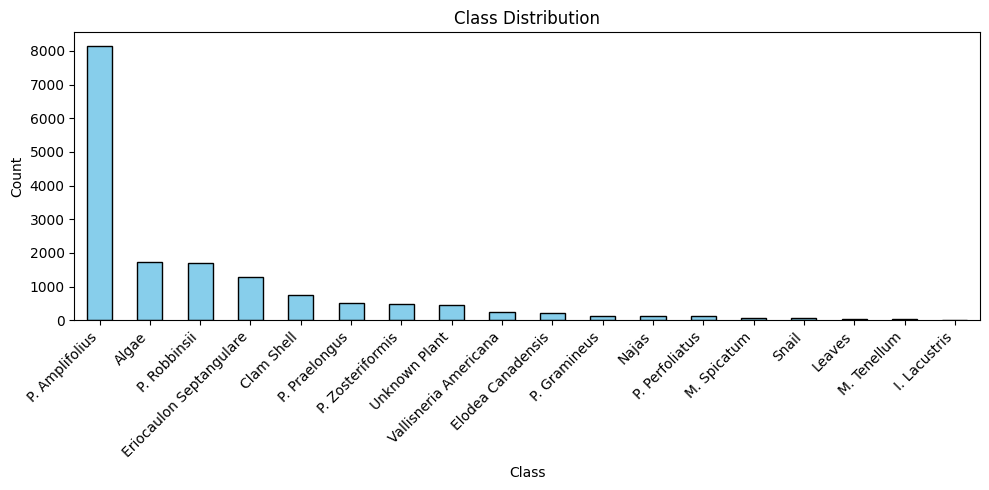

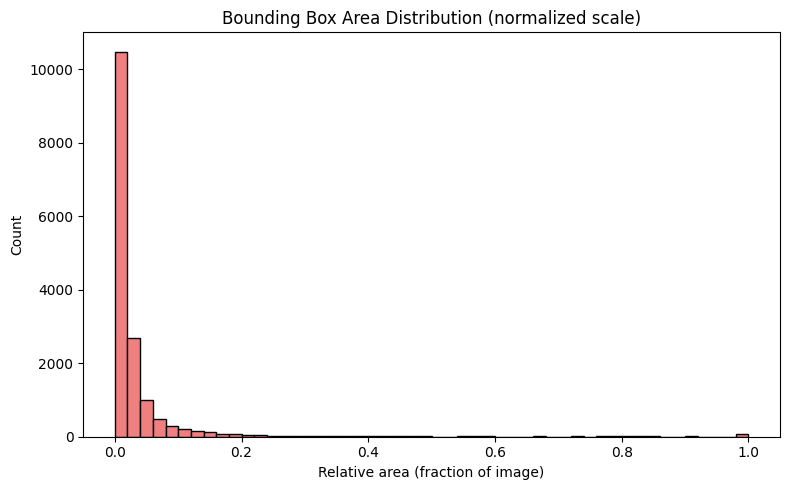

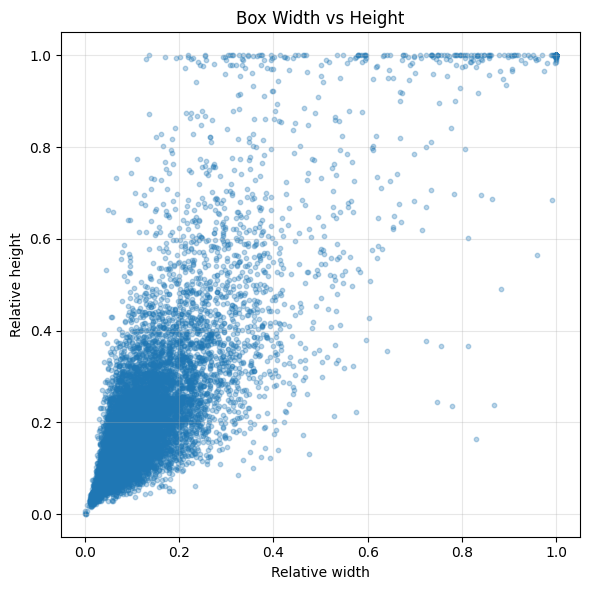

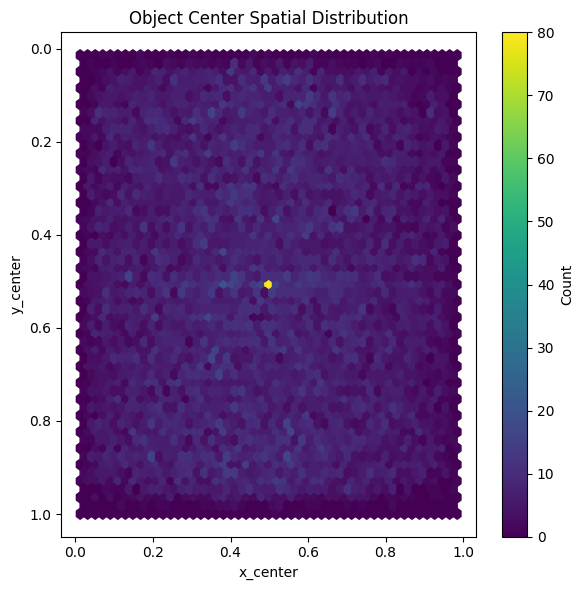


📋 Per-Class Summary:


,class_name,n_images,n_boxes,mean_width,std_width,mean_height,std_height,mean_area,std_area
9,P. Amplifolius,803,8142,0.117136,0.096351,0.190168,0.138127,0.032770,0.081619
0,Algae,343,1717,0.148716,0.168380,0.233115,0.209668,0.064030,0.164884
13,P. Robbinsii,344,1690,0.123487,0.124102,0.206047,0.162124,0.041362,0.110866
3,Eriocaulon Septangulare,140,1276,0.077018,0.135950,0.118338,0.158845,0.029074,0.131840
1,Clam Shell,161,752,0.027817,0.025350,0.051617,0.039744,0.002298,0.012482
12,P. Praelongus,212,525,0.184356,0.118220,0.272624,0.155901,0.063400,0.086007
14,P. Zosteriformis,181,469,0.182890,0.135792,0.273582,0.171901,0.066538,0.114999
16,Unknown Plant,242,448,0.145250,0.139193,0.240301,0.214995,0.058441,0.135828
17,Vallisneria Americana,68,257,0.134290,0.162276,0.212905,0.232097,0.062425,0.148477
2,Elodea Canadensis,75,228,0.089947,0.060035,0.146406,0.110517,0.016831,0.029680


In [13]:
# Display classes
print(f"Found {len(class_names)} classes:")
for i, name in enumerate(class_names):
    print(f"  {i}: {name}")
    
# Get directories
train_img_dir = os.path.join(proj_dir, data_cfg["train"])
val_img_dir = os.path.join(proj_dir, data_cfg.get("val", None))
test_img_dir = os.path.join(proj_dir, data_cfg.get("test", None))
label_dirs = []
for split in [train_img_dir, val_img_dir, test_img_dir]:
    if split:
        label_dir = split.replace("images", "labels")
        label_dirs.append(label_dir)

# Collect label data
records = []
for label_dir in label_dirs:
    print(label_dir)
    label_files = glob.glob(os.path.join(label_dir, "*.txt"))
    for lf in tqdm(label_files, desc=f"Reading {label_dir}"):
        with open(lf, "r") as f:
            for line in f:
                vals = line.strip().split()
                if len(vals) != 5:
                    continue  # skip malformed lines
                cls, x, y, w, h = map(float, vals)
                records.append({
                    "class_id": int(cls),
                    "class_name": class_names[int(cls)] if int(cls) < len(class_names) else f"unknown_{int(cls)}",
                    "x_center": x,
                    "y_center": y,
                    "width": w,
                    "height": h,
                    "label_file": os.path.basename(lf),
                    "split": "train" if label_dir == label_dirs[0] else "val"
                })

# --- Convert to DataFrame ---
df = pd.DataFrame(records)
print(f"\n📊 Total annotations: {len(df)} across {df['label_file'].nunique()} images")

# --- Class distribution ---
plt.figure(figsize=(10, 5))
df["class_name"].value_counts().plot(kind="bar", color="skyblue", edgecolor="black")
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Count")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

# --- Box size distribution ---
df["box_area"] = df["width"] * df["height"]

plt.figure(figsize=(8, 5))
plt.hist(df["box_area"], bins=50, color="lightcoral", edgecolor="black")
plt.title("Bounding Box Area Distribution (normalized scale)")
plt.xlabel("Relative area (fraction of image)")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

# --- Width vs Height scatter (shape aspect) ---
plt.figure(figsize=(6, 6))
plt.scatter(df["width"], df["height"], alpha=0.3, s=10)
plt.title("Box Width vs Height")
plt.xlabel("Relative width")
plt.ylabel("Relative height")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# --- Spatial heatmap of object locations ---
plt.figure(figsize=(6, 6))
plt.hexbin(df["x_center"], df["y_center"], gridsize=50, cmap="viridis")
plt.title("Object Center Spatial Distribution")
plt.xlabel("x_center")
plt.ylabel("y_center")
plt.colorbar(label="Count")
plt.gca().invert_yaxis()  # YOLO y=0 at top
plt.tight_layout()
plt.show()

# --- Per-class summary ---
summary = (
    df.groupby("class_name")
    .agg({
        "label_file": "nunique",
        "x_center": "count",
        "width": ["mean", "std"],
        "height": ["mean", "std"],
        "box_area": ["mean", "std"]
    })
    .reset_index()
)
summary.columns = ["class_name", "n_images", "n_boxes",
                   "mean_width", "std_width", "mean_height", "std_height",
                   "mean_area", "std_area"]

print("\n📋 Per-Class Summary:")
display(summary.sort_values("n_boxes", ascending=False))

## Example Images

Ground truths:
{}


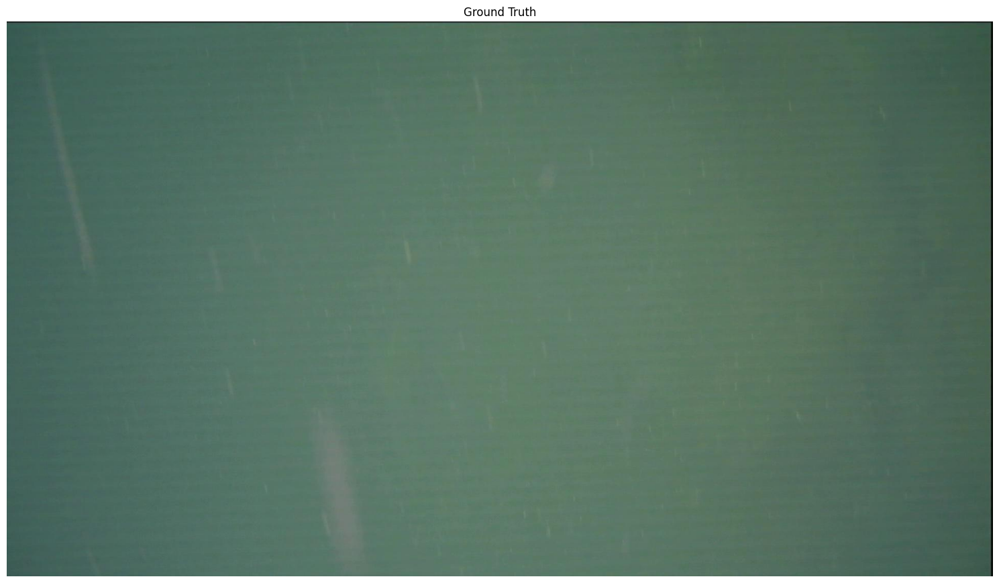

Ground truths:
{'P. Amplifolius': 7}


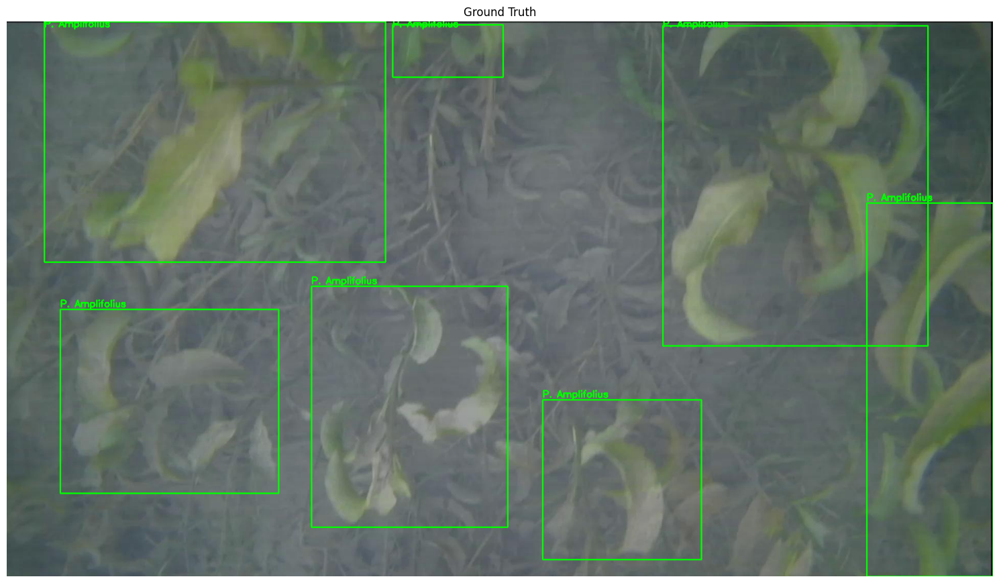

Ground truths:
{'P. Amplifolius': 26}


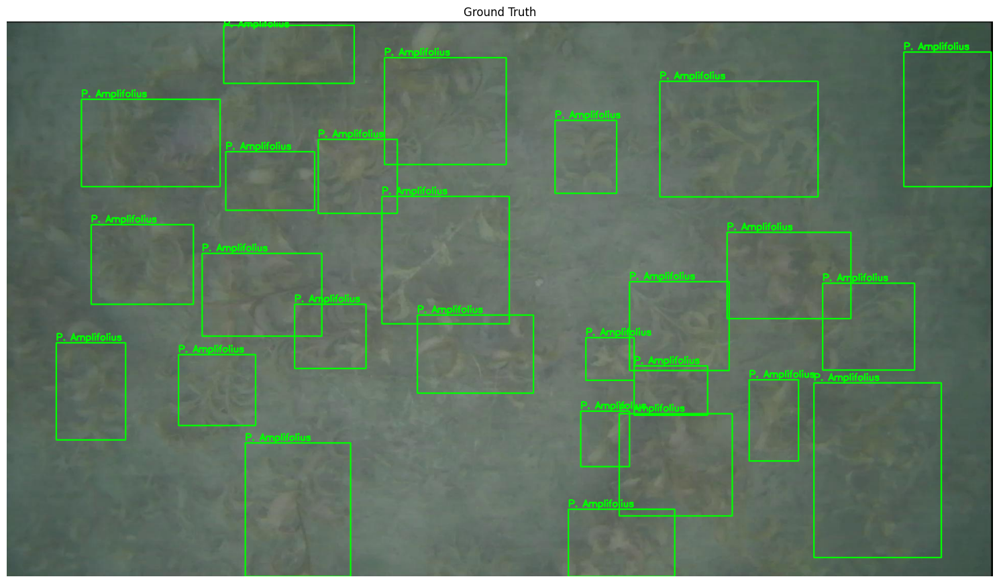

Ground truths:
{'Algae': 3, 'Unknown Plant': 1}


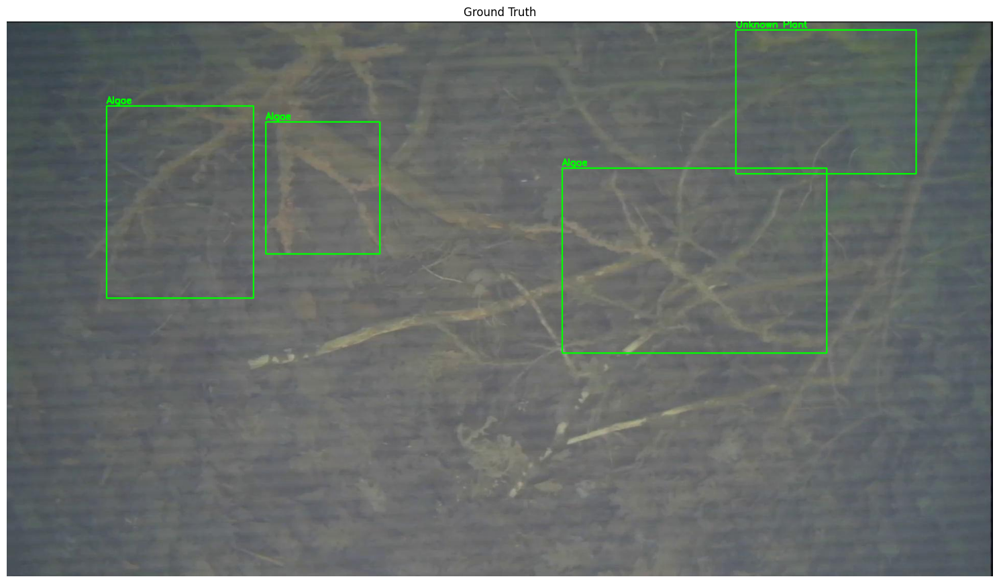

Ground truths:
{'P. Amplifolius': 7, 'Elodea Canadensis': 1, 'P. Zosteriformis': 1, 'P. Robbinsii': 21}


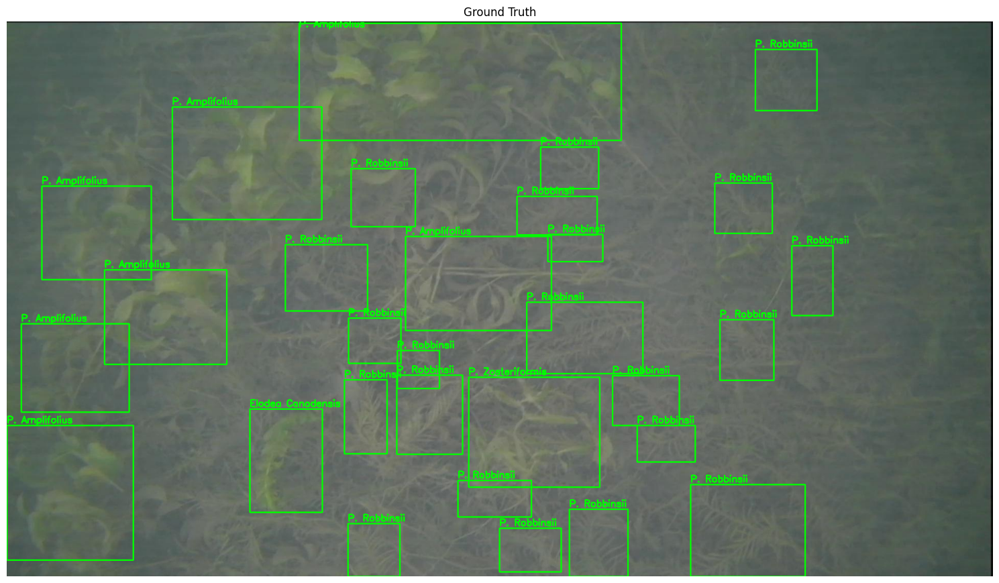

Ground truths:
{'P. Praelongus': 2}


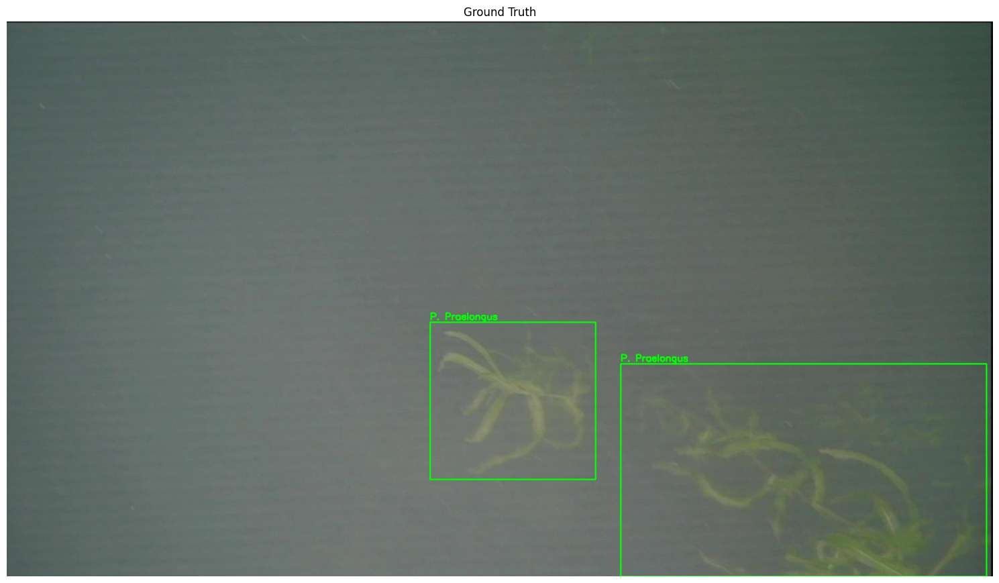

Ground truths:
{'P. Amplifolius': 18}


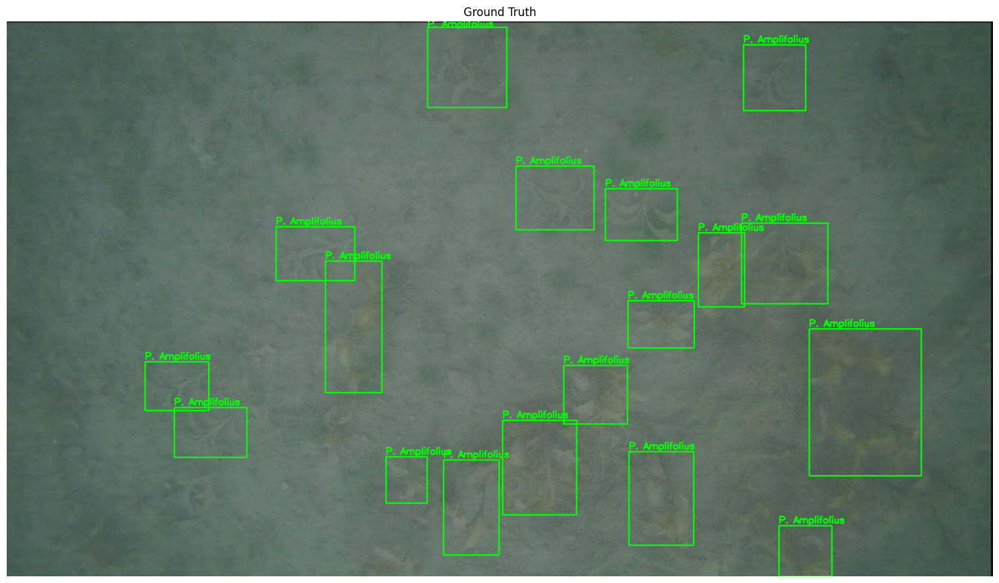

Ground truths:
{'P. Amplifolius': 4, 'P. Robbinsii': 5}


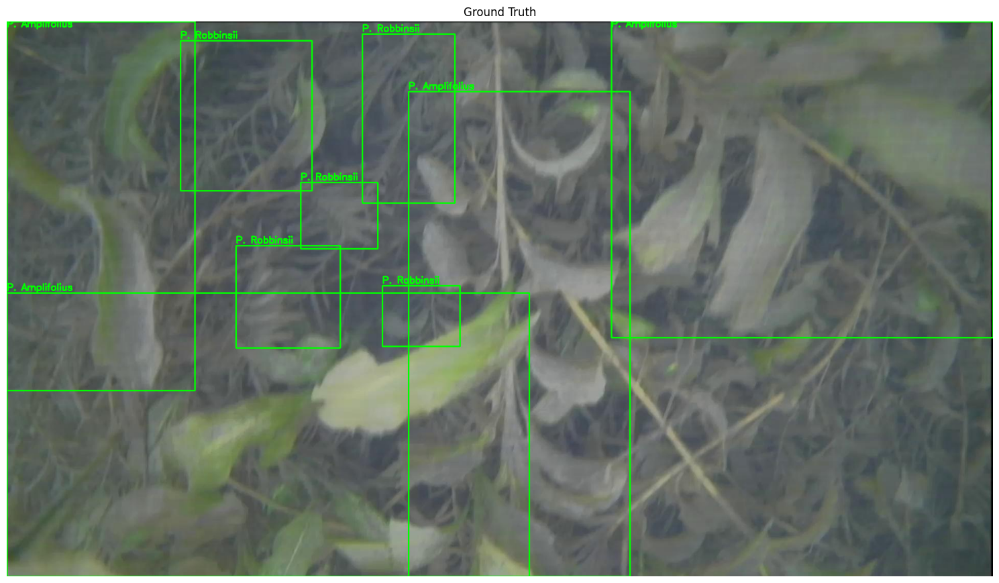

Ground truths:
{'P. Amplifolius': 24, 'P. Robbinsii': 1}


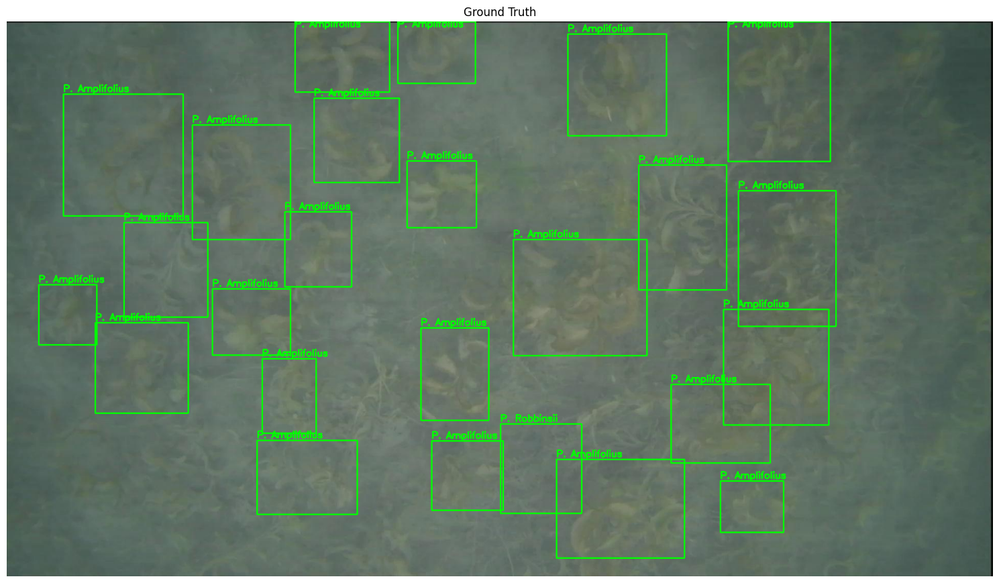

Ground truths:
{'Unknown Plant': 6, 'Eriocaulon Septangulare': 9}


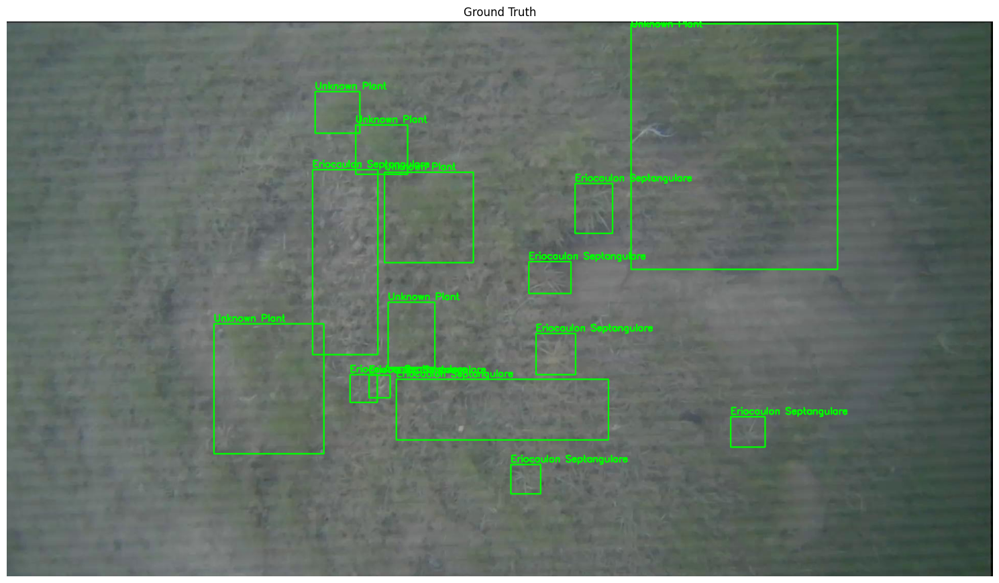

In [22]:
# Display Random Example Images with GT Annotations
def show_prediction_sample(image_dir, class_names, count):
    image_files = glob.glob(os.path.join(image_dir, "*.jpg"))
    
    for i in range(count):
        image_path = random.choice(image_files)

        # Draw ground truth boxes
        gt_img = cv2.imread(image_path)
        label_path = image_path.replace("\\images\\", "\\labels\\").rsplit(".", 1)[0] + ".txt"
        h, w, _ = gt_img.shape
        gt_counts = dict()
        
        if os.path.exists(label_path):
            with open(label_path, "r") as f:
                for line in f:
                    cls, x, y, bw, bh = map(float, line.strip().split())
                    x1, y1 = int((x - bw/2) * w), int((y - bh/2) * h)
                    x2, y2 = int((x + bw/2) * w), int((y + bh/2) * h)

                    # Get class name
                    class_name = class_names[int(cls)] if int(cls) in class_names else str(int(cls))
                    gt_counts[class_name] = gt_counts[class_name] + 1 if class_name in gt_counts.keys() else 1
                    
                    # Draw box and label
                    cv2.rectangle(gt_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                    cv2.putText(gt_img, class_name, (x1, max(y1 - 5, 10)),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

        # Display ground truth counts
        print(f"Ground truths:\n{gt_counts}")
        
        # Convert BGR → RGB for plotting
        gt_img_rgb = cv2.cvtColor(gt_img, cv2.COLOR_BGR2RGB)

        # Display side by side
        plt.figure(figsize=(15, 10))
        plt.imshow(gt_img_rgb)
        plt.title("Ground Truth")
        plt.axis("off")
        plt.tight_layout()
        plt.show()
    
# Load your trained YOLO model
class_name_dict = {i: name for i, name in enumerate(class_names)}
show_prediction_sample(image_dir, class_name_dict, 10)